In [198]:
### Importamos todo

import numpy as np
import pandas as pd
import urllib.request
from sklearn.model_selection import train_test_split
import seaborn as sns
from datetime import datetime

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
%matplotlib inline

cm = plt.cm.RdBu
cm_bright = ListedColormap(['#FF0000', '#0000FF'])

pd.set_option('display.max_rows', None) 
pd.set_option('display.max_columns', None) 

# Como en cualquier problema de ML se empieza con el analisis de los datos

### Realizaremos los siguientes pasos:


-Dividir los datos en conjuntos de entrenamiento y prueba usando una proporción adecuada (por ejemplo, 70% de entrenamiento y 30% de prueba).

-Eliminar cualquier columna que no sea relevante para el problema o que tenga muchos valores nulos. (mediante drop y busqueda de nulos)

-Completar los valores nulos en las columnas restantes con una estrategia apropiada (seguramente con el promedio)

-Separar las características del objetivo (el precio en este caso) en diferentes conjuntos de datos.

No veo otra forma de importar datos y separar los modelos

In [199]:
## Leemos dataset
airbnb = pd.read_csv('airbnb-listings-extract.csv', sep=';', decimal='.')

## Dividimos
train, test = train_test_split(airbnb, test_size=0.3, shuffle=True, random_state=0)

## Vemos como son los dataset
print(f'Dimensiones de training: {train.shape}')
print(f'Dimensiones de test: {test.shape}')

# Guardamos los datasets en un archivo csv
train.to_csv('./train2.csv', sep=';', decimal='.', index=False)
test.to_csv('./test2.csv', sep=';', decimal='.', index=False)

## Seleccionamos el dataframe de trabajo
df = pd.read_csv('./train.csv', sep=';', decimal='.')

Dimensiones de training: (10346, 89)
Dimensiones de test: (4434, 89)


# Ahora empezamos a analizar los datos que tenemos
## Observamos la info que hay en cada columna y siguiendo los pasos previos:

-Eliminar cualquier columna que no sea relevante para el problema o que tenga muchos valores nulos. (mediante drop y busqueda de nulos)

-Completar los valores nulos en las columnas restantes con una estrategia apropiada (seguramente con el promedio)

-Separar las características del objetivo (el precio en este caso) en diferentes conjuntos de datos.




In [200]:
# Eliminar columnas:
# Primero vemos cuales tenemos y la informacion que aportan. La traspuesta nos lo facilita

df.head().T

## Tras echar un ojo rapido, se ven cosas como el listing Url, nombres de inquilino, etc, toda
## informacion que no consideramos relevante para predecir el precio. Si tuviese tiempo quiza un
## analisis estadistico de todas las variables nos podria decir, pero a veces el sentido comun es mas practiopT
## Calle, Country o ZipCode al final ocurre lo mismo, Geolocation o Reviews per Month similar. Aqui nos cargamos todo
## Obviamente repito, si tengo tiempo, intento algun grafico (seaborn) o modelo de estadistica para ver si lo estoy haciendo bien

columnas_sininfo = [
    'ID', 'Listing Url', 'Scrape ID', 'Last Scraped', 'Thumbnail Url', 'Medium Url', 
    'Picture Url', 'XL Picture Url', 'Host ID', 'Host URL', 'Host Name', 
    'Host Thumbnail Url', 'Host Picture Url', 'Host Neighbourhood', 'Weekly Price', 
    'Monthly Price', 'Calendar Updated', 'Calendar last Scraped', 'First Review', 
    'Last Review', 'Reviews per Month', 'Geolocation', 'Calculated host listings count',
    'Host Listings Count', 'Host Total Listings Count','Name', 'Summary', 'Space', 'Description',
    'Neighborhood Overview', 'Notes', 'Transit', 'Access', 'Interaction', 'House Rules',
    'Host Location', 'Host About','Street', 'State', 'Market', 'Smart Location', 'Country', 'Zipcode'
]

df.drop(columnas_sininfo, axis=1, inplace=True)
df.head()

,Experiences Offered,Host Since,Host Response Time,Host Response Rate,Host Acceptance Rate,Host Verifications,Neighbourhood,Neighbourhood Cleansed,Neighbourhood Group Cleansed,City,Country Code,Latitude,Longitude,Property Type,Room Type,Accommodates,Bathrooms,Bedrooms,Beds,Bed Type,Amenities,Square Feet,Price,Security Deposit,Cleaning Fee,Guests Included,Extra People,Minimum Nights,Maximum Nights,Has Availability,Availability 30,Availability 60,Availability 90,Availability 365,Number of Reviews,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,License,Jurisdiction Names,Cancellation Policy,Features
0,none,2015-04-13,within a few hours,100.0,NaN,"email,phone,reviews,work_email",Jerónimos,Jerónimos,Retiro,Madrid,ES,40.407732,-3.684819,Apartment,Entire home/apt,4,1.0,1.0,2.0,Real Bed,"TV,Internet,Wireless Internet,Air conditioning...",NaN,60.0,NaN,25.0,1,0,2,1125,NaN,9,32,52,117,12,95.0,9.0,10.0,10.0,10.0,10.0,9.0,NaN,NaN,moderate,"Host Has Profile Pic,Is Location Exact,Require..."
1,none,2016-07-22,within an hour,100.0,NaN,"email,phone,reviews,jumio,offline_government_i...",NaN,Sol,Centro,Madrid,ES,40.415802,-3.705340,Apartment,Entire home/apt,4,1.0,1.0,2.0,Real Bed,"TV,Internet,Wireless Internet,Air conditioning...",NaN,50.0,NaN,15.0,1,0,1,1125,NaN,15,39,64,208,20,91.0,9.0,9.0,10.0,10.0,10.0,10.0,NaN,NaN,flexible,"Host Has Profile Pic,Host Identity Verified,Re..."
2,none,2016-07-17,within an hour,100.0,NaN,"email,phone,facebook,google,reviews,jumio,gove...",Carabanchel,Vista Alegre,Carabanchel,Madrid,ES,40.389048,-3.740374,Apartment,Shared room,1,1.5,1.0,8.0,Real Bed,"Internet,Wireless Internet,Wheelchair accessib...",NaN,10.0,NaN,5.0,1,0,3,30,NaN,14,44,74,140,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,moderate,"Host Has Profile Pic,Host Identity Verified,Is..."
3,none,2014-05-08,within a few hours,100.0,NaN,"email,phone,reviews,work_email",NaN,Embajadores,Centro,Madrid,ES,40.412814,-3.703052,Apartment,Private room,2,3.0,1.0,1.0,Real Bed,"Wireless Internet,Kitchen,Smoking allowed,Heat...",NaN,30.0,NaN,NaN,1,0,10,1125,NaN,0,6,36,311,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,strict,"Host Has Profile Pic,Requires License"
4,none,2012-02-06,within an hour,100.0,NaN,"email,phone,reviews,jumio",Gaztambide,Gaztambide,Chamberí,Madrid,ES,40.438631,-3.713716,Apartment,Private room,2,1.0,1.0,1.0,Real Bed,"TV,Cable TV,Internet,Wireless Internet,Air con...",NaN,32.0,NaN,NaN,1,10,1,1125,NaN,7,34,62,337,97,92.0,9.0,9.0,9.0,10.0,9.0,9.0,NaN,NaN,strict,"Host Has Profile Pic,Host Identity Verified,Is..."


## Busqueda de missing values

Tras el head, observamos algunas columnas con valores NaN y none. 
Lo que vamos a hacer acontinuacion una vez elimnadas columnas (con riesgo de perdida de datos) siguiendo los pasos es
buscar dentro de las columnas, cuales tendran valores distintos y los missing values. Con ello veremos duplicidades asi como columnas "vacias"

In [201]:
#Siguiente paso ver el número de valores distintos por columnas.
# Contar el número de valores únicos en cada columna de df

valores_unicos = df.nunique()
print(valores_unicos)

## y ahora vemos cuales tiene nulos por columnas:
df.isnull().any()

# Hay determinadas columnas con muy pocos datos, seguimos eliminando
columnas_muyvacias = [
    'Host Acceptance Rate', 'Square Feet', 'Has Availability', 'License', 'Jurisdiction Names'
]

df.drop(columnas_muyvacias, axis=1, inplace=True)

Experiences Offered                 5
Host Since                       2043
Host Response Time                  4
Host Response Rate                 67
Host Acceptance Rate               10
Host Verifications                191
Neighbourhood                     351
Neighbourhood Cleansed            444
Neighbourhood Group Cleansed       47
City                              222
Country Code                       18
Latitude                        11824
Longitude                       11824
Property Type                      21
Room Type                           3
Accommodates                       16
Bathrooms                          17
Bedrooms                           10
Beds                               16
Bed Type                            5
Amenities                       10077
Square Feet                        89
Price                             345
Security Deposit                  115
Cleaning Fee                      104
Guests Included                    15
Extra People

### Limpieza de Variables repetidas o sin informacion util

Para ello seguimos los pasos descritos previamente
vamos a usar seaborn y calcular la matriz de correlacion


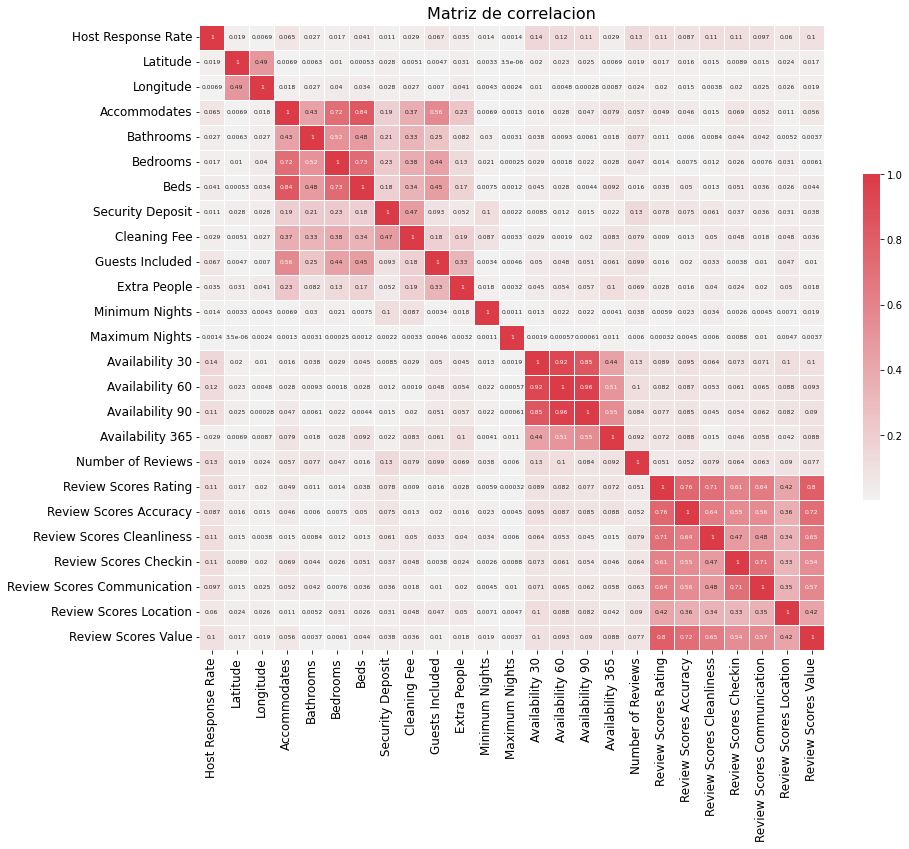

In [202]:
# Calcular la matriz de correlación
corr = np.abs(df.drop(['Price'], axis=1).corr())

# Configurar la figura y color de matplotlib
fig, ax = plt.subplots(figsize=(14,12))
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Dibujar el mapa de calor con la máscara y la proporción de aspecto correcta
sns.heatmap(corr, cmap=cmap, annot=True, center=0, square=True,
            linewidths=.5, cbar_kws={"shrink": .5}, annot_kws={"fontsize":6})

# titulo
ax.set_title("Matriz de correlacion", fontsize=16)

# Ajustar labels
ax.tick_params(labelsize=12)

# Grafico
plt.show()

In [203]:
# Tras ver la matriz vemos entre las variables reviews que hay mucha correlacion ~ 1
# Por ende aquellas las eliminamos, mientras que los reviews los agrupamos dado que pueden ser utiles
# usando asi su valor medio

reviews = df.loc[: , "Review Scores Rating":"Review Scores Value"]
df['Average Review'] = reviews.mean(axis=1)

df.drop(['Availability 30', 'Availability 60', 'Availability 90', 'Review Scores Rating', 
         'Review Scores Accuracy', 'Review Scores Cleanliness', 'Review Scores Checkin',
       'Review Scores Communication', 'Review Scores Location', 'Review Scores Value',
        'Accommodates'], axis=1, inplace=True)

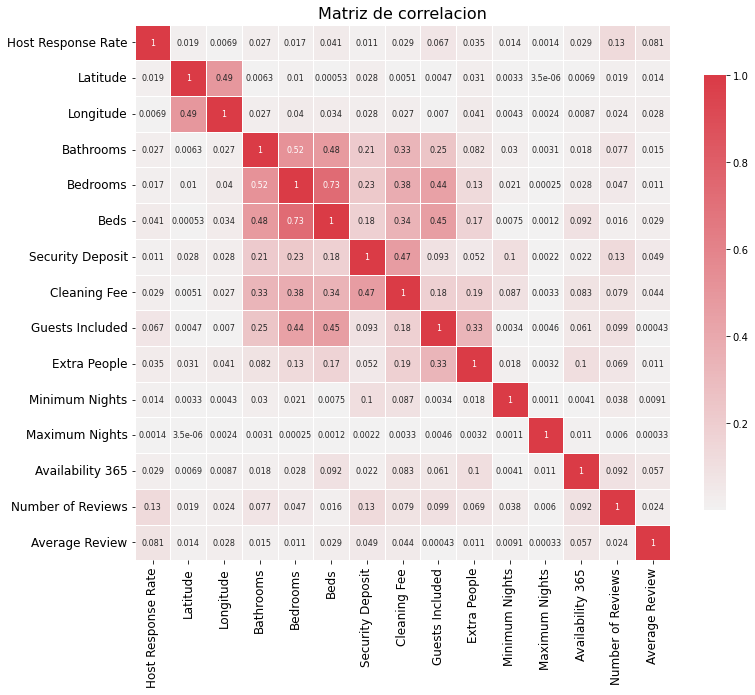

In [204]:
## Volvemos a ver matriz de correlacion para ver como ha sido el cambio
# Calcular la matriz de correlación
corr = np.abs(df.drop(['Price'], axis=1).corr())

# Configurar la figura y color
fig, ax = plt.subplots(figsize=(12,10))
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Dibujar el mapa de calor con la máscara y la proporción de aspecto correcta
sns.heatmap(corr, cmap=cmap, annot=True, center=0, square=True,
            linewidths=.5, cbar_kws={"shrink": .8}, annot_kws={"fontsize":8})

# titulo
ax.set_title("Matriz de correlacion", fontsize=16)

# Ajustar labels
ax.tick_params(labelsize=12)

# Grafico
plt.show()

Asi vemos que la matriz ahora es mucho mas simetrica y las relaciones no son tan dependientes

### Eliminacion de datos "alejados"

Tras dejar casi todas las columnas, el siguiente paso en la descripcion es la limpieza de los datos que son raros o estan fuera de los precios mas ocurrentes

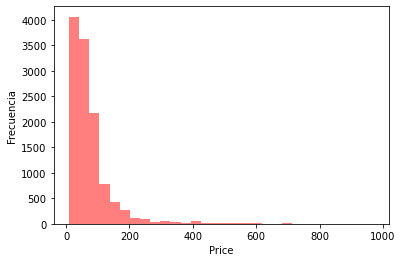

Numero de datos por encima de 200= 464


In [205]:
## Primero pintamos el grafico de frecuencias y vemos donde esta la mayoria
## Por debajo de 200 es donde se encuentra la mayoria

plt.hist(df['Price'], alpha=0.5, bins=30, color='red')
plt.xlabel('Price')
plt.ylabel('Frecuencia')

plt.show()


## Ademas analizamos cuantos valores hay por debajo y encima del umbral de 200 asi vemos 
print("Numero de datos por encima de 200=",len(df[df['Price'] > 200]))


In [206]:
## A cotinuacion vamos a seleccionar los valores inferiores a 200 y no nulos

df = df[df['Price'].notnull() & (df['Price'] < 200)]

## Y observamos como queda el dataframe 
df.head().T


,0,1,2,3,4
Experiences Offered,none,none,none,none,none
Host Since,2015-04-13,2016-07-22,2016-07-17,2014-05-08,2012-02-06
Host Response Time,within a few hours,within an hour,within an hour,within a few hours,within an hour
Host Response Rate,100.0,100.0,100.0,100.0,100.0
Host Verifications,"email,phone,reviews,work_email","email,phone,reviews,jumio,offline_government_i...","email,phone,facebook,google,reviews,jumio,gove...","email,phone,reviews,work_email","email,phone,reviews,jumio"
Neighbourhood,Jerónimos,NaN,Carabanchel,NaN,Gaztambide
Neighbourhood Cleansed,Jerónimos,Sol,Vista Alegre,Embajadores,Gaztambide
Neighbourhood Group Cleansed,Retiro,Centro,Carabanchel,Centro,Chamberí
City,Madrid,Madrid,Madrid,Madrid,Madrid
Country Code,ES,ES,ES,ES,ES


In [207]:
## Y un analisis previo estadistico del DF
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Host Response Rate,9872.0,94.819996,15.120289,0.000000,100.000000,100.000000,100.000000,100.000000
Latitude,11285.0,40.486071,4.595661,-37.851182,40.409773,40.419178,40.430520,55.966912
Longitude,11285.0,-3.821344,13.528603,-123.124429,-3.707585,-3.700942,-3.685942,153.371427
Bathrooms,11245.0,1.232815,0.563749,0.000000,1.000000,1.000000,1.000000,8.000000
Bedrooms,11265.0,1.269596,0.777219,0.000000,1.000000,1.000000,1.000000,10.000000
Beds,11251.0,1.931384,1.400477,1.000000,1.000000,1.000000,2.000000,16.000000
Price,11285.0,62.101462,37.735374,9.000000,32.000000,55.000000,80.000000,199.000000
Security Deposit,4831.0,181.717450,105.519681,0.000000,100.000000,150.000000,200.000000,990.000000
Cleaning Fee,6689.0,28.722679,20.315457,0.000000,15.000000,25.000000,35.000000,250.000000
Guests Included,11285.0,1.536110,0.997006,0.000000,1.000000,1.000000,2.000000,16.000000


#### Generación de características

Al igual que con reviews, ahora las variables categoricas las tenemos que clasificar y generar

In [208]:
# Las variables de barrio son similares y la informacion es parecida

df_new = df[['Neighbourhood', 'Neighbourhood Cleansed', 'Neighbourhood Group Cleansed']]

## Ademas podemos ver cuales tienen valores missing como sieempre en el analisis de variables
df_new.isnull().any()

Neighbourhood                    True
Neighbourhood Cleansed          False
Neighbourhood Group Cleansed     True
dtype: bool

 #### Observamos que la unica variable sin valores nulos es la del "Neighbourhood Cleansed"
 Tambien vemos que son similares Neighbourhood Cleansed y Neighbourhood Group Cleansed
 Por ello, sabiendo que el primero no tiene campos vacios, añadiremos al segundo y sus valores perdidos

In [209]:
df_new["Final Neighbourhood"] = df_new["Neighbourhood Group Cleansed"].combine_first(df_new["Neighbourhood Cleansed"])

#Y observamos el numero de datos missing o perdidos
df_new.isnull().sum()

Neighbourhood                   3917
Neighbourhood Cleansed             0
Neighbourhood Group Cleansed     667
Final Neighbourhood                0
dtype: int64

In [210]:
# Y numero de valores distintos
df_new.nunique()

Neighbourhood                   322
Neighbourhood Cleansed          418
Neighbourhood Group Cleansed     46
Final Neighbourhood             253
dtype: int64

Tras el analisis anteirorn actualizamos el dataframe

In [211]:
df["Final Neighbourhood"] = df["Neighbourhood Group Cleansed"].fillna(df["Neighbourhood Cleansed"])
df.drop(["Neighbourhood", "Neighbourhood Group Cleansed", "Neighbourhood Cleansed"], axis=1, inplace=True)

#### Segunda generación de características:

En este caso nos centramos en las variables, Host Verifications, Features y Amenities.
Como vemos, todas ellas tienen informacion que seria necesario trabajar y poder sacar algo
como no hay tiempo, lo mas logico y simple es transformar en valores esos strings.
Por ejemplo contabilizar las demas variables, independiente del que incluyan
De esa manera nos sirve como indicador


In [212]:
df_l = df[['Features', 'Amenities', 'Host Verifications']]
df_l = df_l.fillna("") 

df_l = df_l.apply(lambda x: x.str.split(",").apply(len))
df_l.head(6)

,Features,Amenities,Host Verifications
0,3,13,4
1,4,18,6
2,5,25,7
3,2,5,4
4,4,15,4
5,5,15,4


#### Actualizamos al dataset original:

In [213]:
df[['Features', 'Amenities', 'Host Verifications']] = df[['Features', 'Amenities', 'Host Verifications']].fillna("")
df[['Features', 'Amenities', 'Host Verifications']] = df[['Features', 'Amenities', 'Host Verifications']].apply(lambda x: x.str.split(",").apply(len))
# Vemos como queda
df.columns

Index(['Experiences Offered', 'Host Since', 'Host Response Time',
       'Host Response Rate', 'Host Verifications', 'City', 'Country Code',
       'Latitude', 'Longitude', 'Property Type', 'Room Type', 'Bathrooms',
       'Bedrooms', 'Beds', 'Bed Type', 'Amenities', 'Price',
       'Security Deposit', 'Cleaning Fee', 'Guests Included', 'Extra People',
       'Minimum Nights', 'Maximum Nights', 'Availability 365',
       'Number of Reviews', 'Cancellation Policy', 'Features',
       'Average Review', 'Final Neighbourhood'],
      dtype='object')

#### Tercera generación de características en este caso fechas

Antigüedad del dueño en la plataforma

In [214]:
from datetime import datetime

#cogemos los no nulos (no perdemos tanto)
df = df[pd.notnull(df['Host Since'])]

df['Host Since'].fillna("", inplace=True)
df['Host Since'] = df['Host Since'].apply(lambda x: datetime.strptime(str(x),'%Y-%m-%d'))
df['Years Being Host'] = df['Host Since'].apply(lambda x: 2017 - x.year)

df.drop(['Host Since'], axis=1, inplace=True)

### Limpieza a fondo de datos 

In [215]:
#print(f"Registros con cero baños: {len(df[df['Bathrooms'] == 0 & (df[df['Price'] == 0])]}") 
# me dio error. Dejo solucion del profe

df = df[df['Bathrooms'] != 0]
df = df[df['Price'] != 0]

SyntaxError: f-string: closing parenthesis '}' does not match opening parenthesis '(' (2941632015.py, line 1)

Se ve que las columnas no numéricas que quedan son:

In [216]:
df = df.query('Bathrooms != 0.0 and Price != 0')
df

,Experiences Offered,Host Response Time,Host Response Rate,Host Verifications,City,Country Code,Latitude,Longitude,Property Type,Room Type,Bathrooms,Bedrooms,Beds,Bed Type,Amenities,Price,Security Deposit,Cleaning Fee,Guests Included,Extra People,Minimum Nights,Maximum Nights,Availability 365,Number of Reviews,Cancellation Policy,Features,Average Review,Final Neighbourhood,Years Being Host
0,none,within a few hours,100.0,4,Madrid,ES,40.407732,-3.684819,Apartment,Entire home/apt,1.0,1.0,2.0,Real Bed,13,60.0,NaN,25.0,1,0,2,1125,117,12,moderate,3,21.857143,Retiro,2
1,none,within an hour,100.0,6,Madrid,ES,40.415802,-3.705340,Apartment,Entire home/apt,1.0,1.0,2.0,Real Bed,18,50.0,NaN,15.0,1,0,1,1125,208,20,flexible,4,21.285714,Centro,1
2,none,within an hour,100.0,7,Madrid,ES,40.389048,-3.740374,Apartment,Shared room,1.5,1.0,8.0,Real Bed,25,10.0,NaN,5.0,1,0,3,30,140,0,moderate,5,NaN,Carabanchel,1
3,none,within a few hours,100.0,4,Madrid,ES,40.412814,-3.703052,Apartment,Private room,3.0,1.0,1.0,Real Bed,5,30.0,NaN,NaN,1,0,10,1125,311,0,strict,2,NaN,Centro,3
4,none,within an hour,100.0,4,Madrid,ES,40.438631,-3.713716,Apartment,Private room,1.0,1.0,1.0,Real Bed,15,32.0,NaN,NaN,1,10,1,1125,337,97,strict,4,21.000000,Chamberí,5
5,none,within an hour,100.0,4,Madrid,ES,40.411880,-3.702481,Apartment,Private room,1.0,1.0,1.0,Real Bed,15,35.0,NaN,NaN,1,0,2,60,356,43,strict,5,22.428571,Centro,3
6,none,within a few hours,100.0,3,Madrid,ES,40.415087,-3.710994,Apartment,Entire home/apt,1.0,1.0,2.0,Real Bed,20,80.0,300.0,18.0,2,21,1,3,75,24,flexible,3,22.571429,Centro,5
7,none,within a few hours,100.0,4,Madrid,ES,40.418266,-3.705617,Apartment,Private room,3.0,1.0,1.0,Real Bed,12,25.0,NaN,14.0,1,5,10,1125,74,0,strict,3,NaN,Centro,3
8,none,within an hour,97.0,5,Illetes,ES,39.539871,2.592716,Apartment,Entire home/apt,1.0,1.0,2.0,Real Bed,20,69.0,150.0,45.0,3,10,4,36,339,1,strict,4,22.857143,Calvià,5
9,none,within an hour,100.0,5,Madrid,ES,40.426410,-3.673278,Apartment,Entire home/apt,2.0,2.0,3.0,Real Bed,23,158.0,NaN,160.0,2,20,7,180,52,3,strict,6,22.428571,Salamanca,6


In [217]:
# A continuacion listamos las columnas no numericas para centrarnos en ellas

object_columns = [col for col in df.columns if df[col].dtype == 'object']
object_columns

['Experiences Offered',
 'Host Response Time',
 'City',
 'Country Code',
 'Property Type',
 'Room Type',
 'Bed Type',
 'Cancellation Policy',
 'Final Neighbourhood']

In [218]:
## De esto vemos en cada columna (no numericas) cuantos valores unicos tenemos

object_columns = [col for col in df.columns if df[col].dtype == 'object']
df_nn = df[object_columns]
unique_values = df_nn.nunique()
unique_values

Experiences Offered      5
Host Response Time       4
City                   191
Country Code            16
Property Type           21
Room Type                3
Bed Type                 5
Cancellation Policy      8
Final Neighbourhood    253
dtype: int64

In [219]:
## Tambien como antes los que  tienen mising values

object_columns = [col for col in df.columns if df[col].dtype == 'object']
df_nn = df[object_columns]
null_values = df_nn.isnull().sum()
null_values

Experiences Offered       0
Host Response Time     1388
City                      2
Country Code              0
Property Type             0
Room Type                 0
Bed Type                  0
Cancellation Policy       0
Final Neighbourhood       0
dtype: int64

In [220]:
### Observamos que solo dos columnas tienen missing values
### Nos centramos en Host response rate y vemos los valores que tiene dentro

In [221]:
value_counts = pd.Series(df_nn["Host Response Time"]).value_counts()
print(value_counts)

within an hour        6076
within a few hours    2180
within a day          1361
a few days or more     224
Name: Host Response Time, dtype: int64


Como no tenemos más datos, rellenamos con la opción más frecuente, en este caso within an hour, sobre el dataset original.

In [222]:
mode = df["Host Response Time"].mode()[0]
df["Host Response Time"].fillna(mode, inplace=True)

#### Analisis del resto de columnas

In [223]:
## Experience Offered 
value_counts = pd.Series(df_nn["Experiences Offered"]).value_counts()
print(value_counts)

none        11219
business        4
social          3
family          2
romantic        1
Name: Experiences Offered, dtype: int64


In [224]:
### Demasiados none. Fuera
df.drop(['Experiences Offered'], axis=1, inplace=True)

In [225]:
### City
value_counts = pd.Series(df_nn["City"]).value_counts()
print(value_counts)

Madrid                                 10203
Barcelona                                206
London                                    95
Paris                                     75
Palma                                     40
Berlin                                    32
Roma                                      29
Dublin                                    28
New York                                  24
Los Angeles                               24
Alcúdia                                   21
Brooklyn                                  21
Wien                                      20
Amsterdam                                 18
Rome                                      16
Madrid, Comunidad de Madrid, ES           14
Toronto                                   12
Palma de Mallorca                         10
Inca                                       9
Chicago                                    8
Washington                                 8
Bondi Beach                                7
Santa Marg

In [226]:
## Country code
value_counts = pd.Series(df_nn["City"]).value_counts()
print(value_counts)

Madrid                                 10203
Barcelona                                206
London                                    95
Paris                                     75
Palma                                     40
Berlin                                    32
Roma                                      29
Dublin                                    28
New York                                  24
Los Angeles                               24
Alcúdia                                   21
Brooklyn                                  21
Wien                                      20
Amsterdam                                 18
Rome                                      16
Madrid, Comunidad de Madrid, ES           14
Toronto                                   12
Palma de Mallorca                         10
Inca                                       9
Chicago                                    8
Washington                                 8
Bondi Beach                                7
Santa Marg

In [227]:
### Basicamente los mayores datos son Madrid y el Codigo pues España
### Por ende, eliminamos

df.drop(['City', 'Country Code'], axis=1, inplace=True)

### Conversion de variables categoricas en valores numericos

#### con el smoother del examen se suaviza la distribucion de frecuencias y se mejora la calidad

Deberíamos considerar la posibilidad de que la muestra de prueba contenga valores que no estén presentes en la muestra de entrenamiento y tomar medidas adecuadas, como crear una categoría "Desconocido". Pero no se hace

In [228]:
## Econding
categorical = ['Host Response Time', 'Property Type', 'Room Type', 'Bed Type', 'Cancellation Policy', 'Final Neighbourhood']

mean_map = {}
for c in categorical:
    mean = df.groupby(c)['Price'].mean()
    df[c] = df[c].map(mean)    
    mean_map[c] = mean

Como medida de tratamiento haremos que aquellos datos vacios utilizaremos
no la moda (mas repetido) sino la media para darles un valor mas acorde a cada columna

Ademas despues haremos un resumen de valores nulos


In [229]:
# Reordenar las columnas para que 'Price' aparezca en primer lugar (por visualizacion)
cols = df.columns.tolist()
cols.insert(0, cols.pop(cols.index('Price')))
df = df[cols]

# Rellenar los valores faltantes con la media de cada columna
df.fillna(df.mean(), inplace=True)

# Comprobar si hay valores nulos en el DataFrame
print(df.isnull().any())

Price                  False
Host Response Time     False
Host Response Rate     False
Host Verifications     False
Latitude               False
Longitude              False
Property Type          False
Room Type              False
Bathrooms              False
Bedrooms               False
Beds                   False
Bed Type               False
Amenities              False
Security Deposit       False
Cleaning Fee           False
Guests Included        False
Extra People           False
Minimum Nights         False
Maximum Nights         False
Availability 365       False
Number of Reviews      False
Cancellation Policy    False
Features               False
Average Review         False
Final Neighbourhood    False
Years Being Host       False
dtype: bool


In [230]:
## Ahora si que mola

## Resumen estadistico
df.describe()


,Price,Host Response Time,Host Response Rate,Host Verifications,Latitude,Longitude,Property Type,Room Type,Bathrooms,Bedrooms,Beds,Bed Type,Amenities,Security Deposit,Cleaning Fee,Guests Included,Extra People,Minimum Nights,Maximum Nights,Availability 365,Number of Reviews,Cancellation Policy,Features,Average Review,Final Neighbourhood,Years Being Host
count,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000,11229.000000
mean,62.233859,62.233859,94.824611,4.127527,40.492999,-3.835718,62.233859,62.233859,1.238717,1.270140,1.932827,62.233859,14.253807,181.716508,28.742288,1.538516,7.482679,3.000356,965.842551,201.355864,23.292368,62.233859,3.731944,21.260371,62.233859,2.758215
std,37.754485,0.522435,14.139337,1.269430,4.553308,13.483206,5.156736,23.330766,0.557712,0.773861,1.397345,1.554922,4.742390,69.113431,15.670342,0.998690,10.492707,13.239739,9632.615438,128.328316,38.557090,7.206774,1.053737,2.162715,16.645810,1.634771
min,10.000000,59.473214,0.000000,1.000000,-37.851182,-123.124429,20.500000,25.733766,0.500000,0.000000,1.000000,43.222222,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,53.405579,1.000000,4.857143,20.000000,0.000000
25%,32.000000,61.914769,94.824611,3.000000,40.409759,-3.707529,63.083949,34.001611,1.000000,1.000000,1.000000,62.447512,11.000000,181.716508,20.000000,1.000000,0.000000,1.000000,360.000000,77.000000,1.000000,53.405579,3.000000,21.000000,58.250000,1.000000
50%,55.000000,62.525857,100.000000,4.000000,40.419152,-3.700916,63.083949,81.289259,1.000000,1.000000,1.000000,62.447512,14.000000,181.716508,28.742288,1.000000,0.000000,2.000000,1125.000000,239.000000,7.000000,61.350999,4.000000,21.260371,66.813011,3.000000
75%,80.000000,62.525857,100.000000,5.000000,40.430508,-3.685801,63.083949,81.289259,1.000000,1.000000,2.000000,62.447512,17.000000,181.716508,30.000000,2.000000,14.000000,3.000000,1125.000000,319.000000,28.000000,69.885674,4.000000,22.285714,66.813011,4.000000
max,199.000000,62.525857,100.000000,10.000000,55.966912,153.371427,148.333333,81.289259,8.000000,10.000000,16.000000,62.447512,39.000000,990.000000,250.000000,16.000000,276.000000,1125.000000,1000000.000000,365.000000,356.000000,95.882353,8.000000,80.000000,198.000000,8.000000


#### Construcción del modelo

Una vez procesados todas las columnas y datos continuamos con el modelo
(en mi opinion, longitu, latitud y alguna mas me las deberia cargar, pero no hay tiempo)

In [237]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

# Dividir los datos en conjuntos de entrenamiento y prueba
X = df.drop('Price', axis=1)
y = df['Price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Escalar los datos de entrenamiento
scaler = preprocessing.StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)

# Escalar los datos de prueba
X_test_scaled = scaler.transform(X_test)


best mean cross-validation score: -515.483
best parameters: {'alpha': 0.10624678308940412}


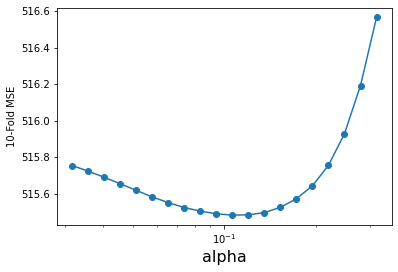

In [241]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso
import matplotlib.pyplot as plt

alpha_vector = np.logspace(-1.5, -0.5, 20)

param_grid = {'alpha': alpha_vector }
lasso_reg = Lasso()
grid = GridSearchCV(estimator=lasso_reg, param_grid=param_grid, scoring='neg_mean_squared_error', cv=20)
grid.fit(X_train_scaled, y_train)

best_score = grid.best_score_
best_params = grid.best_params_

## En este caso hemos usado la funcion LasoCV
## validacion cruzada y el mejor metodo de regularizacion
## De esta regresion lineal hemos añadido simplemente 20 pliegues mas para el MSE
## Si lo comparamos con la solucion la diferencia es pequeña.


print(f"best mean cross-validation score: {best_score:.3f}")
print(f"best parameters: {best_params}")

##Ademas pintamos la relacion entre los valores de alpha y el MSE para el modelo usado
cv_results = grid.cv_results_
mean_test_scores = -cv_results["mean_test_score"]
plt.semilogx(alpha_vector, mean_test_scores, "-o")
plt.xlabel("alpha", fontsize=16)
plt.ylabel("10-Fold MSE")
plt.show()


In [245]:
### Data set de test
## Igual que antes hacemos limpieza y acrualizamos el dataframe

df_test = pd.read_csv('./test2.csv', sep=';', decimal='.')

columnas_sininfo = [
    'ID', 'Listing Url', 'Scrape ID', 'Last Scraped', 'Thumbnail Url', 'Medium Url', 
    'Picture Url', 'XL Picture Url', 'Host ID', 'Host URL', 'Host Name', 
    'Host Thumbnail Url', 'Host Picture Url', 'Host Neighbourhood', 'Weekly Price', 
    'Monthly Price', 'Calendar Updated', 'Calendar last Scraped', 'First Review', 
    'Last Review', 'Reviews per Month', 'Geolocation', 'Calculated host listings count',
    'Host Listings Count', 'Host Total Listings Count','Name', 'Summary', 'Space', 'Description',
    'Neighborhood Overview', 'Notes', 'Transit', 'Access', 'Interaction', 'House Rules',
    'Host Location', 'Host About'
]

columnas_muyvacias = [
    'Host Acceptance Rate', 'Square Feet', 'Has Availability', 'License', 'Jurisdiction Names'
]

## Limpiamos columnas basicamente

df_test.drop(columnas_sininfo, axis=1, inplace=True)
df_test.drop(['Street', 'State', 'Market', 'Smart Location', 'Country', 'Zipcode'], axis=1, inplace=True)
df_test.drop(columnas_muyvacias, axis=1, inplace=True)

## Juntamos reviews
reviews = df_test.loc[: , "Review Scores Rating":"Review Scores Value"]
df_test['Average Review'] = reviews.mean(axis=1)


df_test.drop(['Availability 30', 'Availability 60', 'Availability 90', 'Review Scores Rating', 
         'Review Scores Accuracy', 'Review Scores Cleanliness', 'Review Scores Checkin',
       'Review Scores Communication', 'Review Scores Location', 'Review Scores Value',
        'Accommodates'], axis=1, inplace=True)

## Nos quedamos con los de antes
df_test = df_test[df_test['Price'] < 200]

## Procedemos a rellenar huecos en categoricas

df_test["Final Neighbourhood"] = df_test["Neighbourhood Group Cleansed"].combine_first(df_test["Neighbourhood Cleansed"])
df_test.drop(["Neighbourhood", "Neighbourhood Group Cleansed", "Neighbourhood Cleansed"], axis=1, inplace=True)

df_test['Features'] = df_test['Features'].replace(np.nan, "", regex=True)
df_test['Amenities'] = df_test['Amenities'].replace(np.nan, "", regex=True)
df_test['Host Verifications'] = df_test['Host Verifications'].replace(np.nan, "", regex=True)

df_test['Features'] = df_test['Features'].str.split(',').apply(lambda x: len(x))
df_test['Amenities'] = df_test['Amenities'].str.split(',').apply(lambda x: len(x))
df_test['Host Verifications'] = df_test['Host Verifications'].str.split(',').apply(lambda x: len(x))

#Fechas
from datetime import datetime
df_test = df_test.dropna(subset=['Host Since'])
df_test['Host Since'] = pd.to_datetime(df_test['Host Since'], format='%Y-%m-%d')
df_test['Years Being Host'] = pd.to_datetime('2017-01-01').year - df_test['Host Since'].dt.year
df_test.drop(['Host Since'], axis=1, inplace=True)

## Resto de columnas, igual que antes
df_test = df_test[df_test['Bathrooms'] != 0]
df_test = df_test[df_test['Price'] != 0]

df_test["Host Response Time"].fillna(df_test["Host Response Time"].mode()[0], inplace=True)
df_test.drop(['Experiences Offered', 'City', 'Country Code'], axis=1, inplace=True)

#Generamos las categoricas
categorical = ['Host Response Time', 'Property Type', 'Room Type', 'Bed Type', 'Cancellation Policy',
 'Final Neighbourhood'
]

## Esto es lo mas rapido
# Categorizamos con los datos de train!
for c in categorical:
    df_test[c] = df_test[c].map(mean_map[c])

# Comprobamos que no quedan valores no numéricos
df[categorical].dtypes

Host Response Time     float64
Property Type          float64
Room Type              float64
Bed Type               float64
Cancellation Policy    float64
Final Neighbourhood    float64
dtype: object

In [246]:
### Al igual que antes hacemos un tratamiento de price
# Obtener columnas y mover price al inicio
cols = list(df_test.columns)
cols.insert(0, cols.pop(cols.index('Price')))

# Reordenar la nueva lista de columnas
df_test = df_test.loc[:, cols]

# Reemplazar los valores que faltan con la media de cada columna
df_test.fillna(df_test.mean(), inplace=True)

# Vemos la forma
print(df.shape, df_test.shape)


(11229, 26) (4223, 26)


In [247]:
from sklearn.preprocessing import StandardScaler

data_test = df_test.values

# Creamos las matrices X_test e y_test de la forma alternativa
y_test = df_test.iloc[:, 0].values.reshape(-1, 1)
X_test = df_test.iloc[:, 1:].values

# Obtenemos los nombres de las características
feature_names_test = df_test.columns[1:]

# Escalamos los datos de prueba con el mismo scaler utilizado para los datos de entrenamiento
scaler = StandardScaler()
XtestScaled = scaler.fit_transform(X_test)


In [249]:
### modelo para el test y el train y comparacion del MSE

from sklearn.metrics import mean_squared_error

# Obtenemos el valor óptimo de alpha
alpha_optimo = grid.best_params_['alpha']

# Entrenamos el modelo Lasso con el valor óptimo de alpha
lasso = Lasso(alpha=alpha_optimo)
lasso.fit(X_train_scaled, y_train)

# Obtenemos las predicciones del modelo Lasso en los datos de entrenamiento y prueba
ytrainLasso = lasso.predict(X_train_scaled)
ytestLasso = lasso.predict(XtestScaled)

# Calculamos el MSE para el modelo Lasso en los datos de entrenamiento y prueba
mseTrainModelLasso = mean_squared_error(y_train, ytrainLasso)
mseTestModelLasso = mean_squared_error(y_test, ytestLasso)

# Imprimimos los resultados del modelo Lasso
print('MSE Modelo Lasso (train): %0.5g' % mseTrainModelLasso)
print('MSE Modelo Lasso (test) : %0.5g' % mseTestModelLasso)

# Imprimimos los coeficientes del modelo Lasso
w = lasso.coef_
for f, wi in zip(feature_names, w):
    print(f, wi)


MSE Modelo Lasso (train): 510.67
MSE Modelo Lasso (test) : 537.88
Experiences Offered -0.0
Host Response Time -1.484778286433127
Host Response Rate -0.946344712323202
Host Verifications -0.6654496373203157
Latitude -0.7817757376771884
Longitude 0.17651373012916247
Property Type 15.613669333585385
Room Type 1.9511832108490088
Bathrooms 7.646165301964488
Bedrooms 1.6050482380065763
Beds 0.5450918713946084
Bed Type 2.471296435132019
Amenities 2.5810846279103155
Security Deposit 6.193410308662363
Cleaning Fee 3.298226587282831
Guests Included -0.15832806239290664
Extra People -0.5162259126120066
Minimum Nights -0.0
Maximum Nights 1.5607848079972715
Availability 365 -2.932510747699213
Number of Reviews -0.49205858655787527
Cancellation Policy 0.6633738035957552
Features 1.2417280052905895
Average Review 9.631957338938042
Final Neighbourhood 0.7876870212853755


In [250]:
## En este caso voy a probar en vez de Grid, el Randomize a ver (seguro que en tiempo voy fino, como me sobra...)
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV
import numpy as np

param_grid = {
    'n_estimators': np.arange(500, 8001, 500),
    'learning_rate': [0.1, 0.01],
    'max_depth': [3, 4, 5]
}

random_search = RandomizedSearchCV(
    GradientBoostingRegressor(random_state=0),
    param_distributions=param_grid,
    cv=5,
    n_iter=20,
    n_jobs=-1
)
random_search.fit(X_train, y_train)

print("best mean cross-validation score: {:.3f}".format(random_search.best_score_))
print("best parameters: {}".format(random_search.best_params_))


best mean cross-validation score: 0.752
best parameters: {'n_estimators': 4000, 'max_depth': 5, 'learning_rate': 0.01}


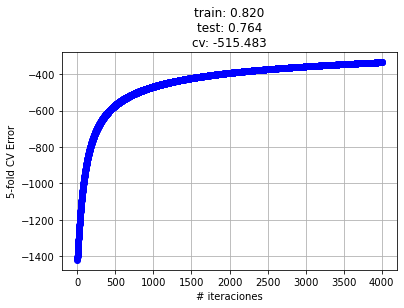

In [259]:
# Obtener los hiperparámetros óptimos de la validación cruzada (solo cojo uno)
learning_rate = 0.01
n_estimators = 4000

# Ajustar el modelo GradientBoostingRegressor con los hiperparámetros óptimos
bt = GradientBoostingRegressor(random_state=0, max_depth=3, learning_rate=learning_rate, n_estimators=n_estimators)
bt.fit(X_train, y_train)

# Calcular la puntuación R^2 promedio en la validación cruzada
cv_score = grid.best_score_

# Calcular la puntuación R^2 del modelo en el conjunto de entrenamiento y prueba
train_score = bt.score(X_train, y_train)
test_score = bt.score(X_test, y_test)

# Calcular el error de validación cruzada promedio en cada iteración
n_iter = len(bt.train_score_)
cv_error = np.zeros(n_iter)
for i in range(n_iter):
    cv_error[i] = 1 - np.mean(bt.train_score_[:i+1])

# Grafica de error de validación cruzada en función del número de iteraciones
plt.plot(range(n_iter), cv_error, 'b--o')
plt.xlabel('# iteraciones')
plt.ylabel('5-fold CV Error')
plt.title('train: %0.3f\ntest: %0.3f\ncv: %0.3f' % (train_score, test_score, cv_score))
plt.grid()
plt.show()


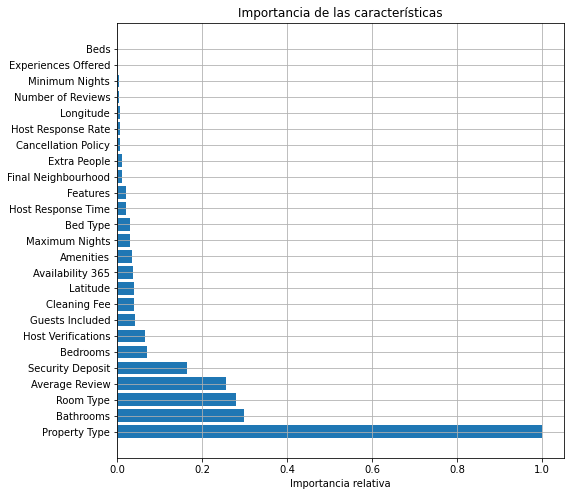

In [260]:
##pesos de las variables

# Calcular la importancia de las características del modelo
importances = bt.feature_importances_
importances = importances / np.max(importances)

# Obtener los índices de características ordenados por importancia descendente
indices = np.argsort(importances)[::-1]

# Gráfico para visualizar la importancia de las características
plt.figure(figsize=(8,8))
plt.barh(range(X_train.shape[1]), importances[indices])
plt.yticks(range(X_train.shape[1]), feature_names[indices])
plt.xlabel('Importancia relativa')
plt.title('Importancia de las características')
plt.grid()
plt.show()


In [261]:
### Ahora si, tras ver el anteiror modelo usamos random forest ahora

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, median_absolute_error

# Crear  modelo 
rf = RandomForestRegressor(oob_score=True)

# Ajustar con los datos de entrenamiento
rf.fit(X_train, y_train)

# Realizar la predicción en los datos de test y calcular r2 en datos de test
y_pred = rf.predict(X_test)
test_score = rf.score(X_test, y_test)

# Calcular error absoluto de la mediana y el error absoluto medio en los datos de test
median_error = median_absolute_error(y_test, y_pred)
mean_error = mean_absolute_error(y_test, y_pred)

# Resultados
print('R^2 en datos de test:', round(test_score, 3))
print('Mediana del error en datos de test:', round(median_error, 3))
print('Media del error en datos de test:', round(mean_error, 3))


R^2 en datos de test: 0.793
Mediana del error en datos de test: 7.24
Media del error en datos de test: 11.446


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, median_absolute_error

from sklearn.model_selection import GridSearchCV

# Definir los parámetros a sintonizar
tuned_parameters = {
    "n_estimators": [100, 500, 1000, 2000]
}

# Crear modelo y ajustar como antes
rf_tuned = GridSearchCV(RandomForestRegressor(), cv=3, param_grid=tuned_parameters)
rf_tuned.fit(X_train, y_train)

# Obtener el mejor modelo encontrado por GridSearchCV
best_rf = rf_tuned.best_estimator_

# Realizar la predicción en los datos de test y calcular r2
y_pred = best_rf.predict(X_test)
test_score = best_rf.score(X_test, y_test)

# Calcular el error absoluto mediano y el error absoluto medio en los datos de prueba con el mejor modelo encontrado
median_error = median_absolute_error(y_test, y_pred)
mean_error = mean_absolute_error(y_test, y_pred)

# Imprimir los resultados
print('Mejores parámetros:', rf_tuned.best_params_)
print('R^2 en datos de test:', round(test_score, 3))
print('Mediana del error en datos de test:', round(median_error, 3))
print('Media del error en datos de test:', round(mean_error, 3))


In [257]:
### Dado que no ha salido la solucino no se que tal, teoricamente el randome forest *siempre arroja mejores resultados
## En este caso el tiempo ha sido a peor aunque el modelo haya sido mejorado un poco, aunque realmente comparado no veo mucha mejora (con la solucion digo)
## Mundo computacional, siempre hay que balancear el precio computacional